# Machine Learning Project: Assessment 2

#### Student ID: 201802972

## Case study

## 1. Aims, objectives and plan

### a) Aims and objectives (4 marks)


The aim of this project is to apply two machine learning algorithms on a dataset and to present findings in a technical report.

The project combines two objectives:
1. Training two models two analyse the dataset
2. Writing a technical report about the analysis conducted

The two machine learning approaches chosen for the analysis are:
1. Support Vector Machine Classifier
2. Convolutional Neural Network Classifier

The dataset chosen for the project is the [DeFungi](https://archive.ics.uci.edu/dataset/773/defungi) dataset for microscopic fungi images classification.


###  b) Plan (2 marks)

First, exploratory data analysis was conducted to discover particularities of the dataset. Then the two approaches were chosen for comparison. Model classes, train and evaluation functions were implemented. Model training with grid search for hyper-parameters was carried out. Finally, performance of the resulting models was analysed from different perspectives and ideas for future improvements were discussed.

## 2. Understanding the case study

###  Case study analysis (8 marks)

1. The DeFungi is an image classification dataset encorporating images of 5 classes of microscopic fungi. Classes in the dataset are unbalanced, and in order to deal with this image augmentation is applied with a number of transformations (e.g. scale, shift, rotation, blur, saturation and other)
2. Some images are of low quality or do not contain any objects. Image augmentation might partially solve this problem, but other ideas are also discussed for future improvements.
3. Features on the images come in a wide range of different scales: some samples capture a population of fungi, while other images only contain a few objects. This range of scale is addressed by exploring different kernel sizes for convolutional neural network. Additionally, a more sophisticated approach to solving this problem is discussed in ideas for the future.
4. Samples have been automatically cropped from microscope imagery to produce the dataset, which could explain the samples of low quality with no objects. Upon visual examination, samples overlap by a small margin - this can also be compensated for by applying augmentation.



## 3. Dataset description (8 marks)


In [59]:
import os
import random
import shutil
from glob import glob

import cv2
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import precision_score, recall_score, f1_score
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms

import albumentations as A

**Scikit-learn** is used in the code for this project to calculate various performance measures.

**PyTorch** is employed for the model implementation, allowing for training on GPU.

**Albumentations** package is used for image augmentation.

Helper functions

In [2]:
def get_img(img, augmentations=None):
    # For image loading
    # Read img file; Convert BGR -> RGB
    img = cv2.imread(img)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    # Apply image augmentations
    if augmentations:
        img = augmentations(image=img)['image']
    # Standardise
    return img / 255

def show_img(img):
    # For image visualisation
    # Load to cpu, detach gradient, cast to ndarray and unstandardise
    img = img.to('cpu').detach().numpy() * 255
    img = img.astype(np.uint8)
    img = np.transpose(img, (1, 2, 0))  # channels 1st -> channels last

    plt.figure(figsize=(8, 8))
    plt.axis('off')
    plt.imshow(img)

def seed_everything(seed):
    # For reproducibility
    # https://pytorch.org/docs/stable/notes/randomness.html
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    # torch.backends.cudnn.benchmark = False
    # torch.backends.cudnn.deterministic = True
    # torch.use_deterministic_algorithms(True)

def seed_worker(worker_id):
    # Used to preserve reproducibility in DataLoader
    # https://pytorch.org/docs/stable/notes/randomness.html
    worker_seed = torch.initial_seed() % 2**32
    np.random.seed(worker_seed)
    random.seed(worker_seed)


In [3]:
def train_test_split(fungi_list, 
                     fungi_root='../data/defungi/',
                     train_end=0.65,
                     val_end=0.80):
    for i, c in enumerate(['H1', 'H2', 'H3', 'H5', 'H6']):
        fungi = np.array(fungi_list[i])

        n = len(fungi)
        indices = np.arange(n)
        train_idx = int(n * train_end)
        val_idx = int(n * val_end)

        np.random.shuffle(indices)
        train_indices = indices[:train_idx]
        val_indices = indices[train_idx:val_idx]
        trainval_indices = indices[:val_idx]
        test_indices = indices[val_idx:]

        train = fungi[train_indices]
        val = fungi[val_indices]
        trainval = fungi[trainval_indices]
        test = fungi[test_indices]

        # This shows that there is no intersection between train and test set
        print(np.intersect1d(train, val),
              np.intersect1d(trainval, test))

        for subset, path in zip([train, val, trainval, test],
                                ['train', 'val', 'trainval', 'test']):
            dst = f'{fungi_root}{path}/{c}/'
            os.makedirs(dst, exist_ok=True)
            for src in subset:
                shutil.copy(src, dst)    

def get_fungi_list(fungi_root):
    return [
        glob(f'{fungi_root}{h}/*') for h in [
            'H1', 'H2', 'H3', 'H5', 'H6'
        ]
    ]


Fungi dataset class implementation

In [4]:
class FungiDataset(Dataset):
    def __init__(self, 
                 fungi_root,
                 balance=False,
                 augmentations=None,
                 transform=None, 
                 target_transform=None):
        fungi_list = get_fungi_list(fungi_root)
        self.augmentations = augmentations
        self.transform = transform
        self.target_transform = target_transform

        if not balance:
            print('\n'.join([f'Class {i}: {len(fungi_list[i])} samples' 
                             for i in range(len(fungi_list))]))
            
            self.fungi = np.concatenate([
                np.array(h) for h in fungi_list
            ])

            # Create labels for the 5 fungi classes
            indices = [len(h) for h in fungi_list]
            self.labels = np.zeros(sum(indices))
            c1 = sum(indices[:1])
            c2 = sum(indices[:2])
            c3 = sum(indices[:3])
            c4 = sum(indices[:4])
            self.labels[c1:c2] = 1
            self.labels[c2:c3] = 2
            self.labels[c3:c4] = 3
            self.labels[c4:] = 4
        else:
            fungi = [np.array(h) for h in fungi_list]
            nfungi = [len(h) for h in fungi]
            max_nfungi = max(nfungi)
            shortage = max_nfungi - np.array(nfungi)

            augmented_fungi = []
            for idx in range(5):
                copies = np.random.choice(fungi[idx], 
                                          size=shortage[idx], 
                                          replace=True)
                augmented = np.concatenate([fungi[idx], copies])
                augmented_fungi.append(augmented)

            print('\n'.join([f'Class {i}: {len(augmented_fungi[i])} samples' 
                             for i in range(len(augmented_fungi))]))
            
            self.fungi = np.concatenate(augmented_fungi)
            self.labels = np.concatenate([
                np.zeros(max_nfungi),
                np.ones(max_nfungi),
                np.ones(max_nfungi) * 2,
                np.ones(max_nfungi) * 3,
                np.ones(max_nfungi) * 4,
            ])

    def __len__(self):
        return len(self.labels)
    
    def __getitem__(self, idx):
        img = get_img(self.fungi[idx], augmentations=self.augmentations)
        label = self.labels[idx]

        if self.transform:
            img = self.transform(img)
        if self.target_transform:
            label = self.target_transform(label)

        return img, label


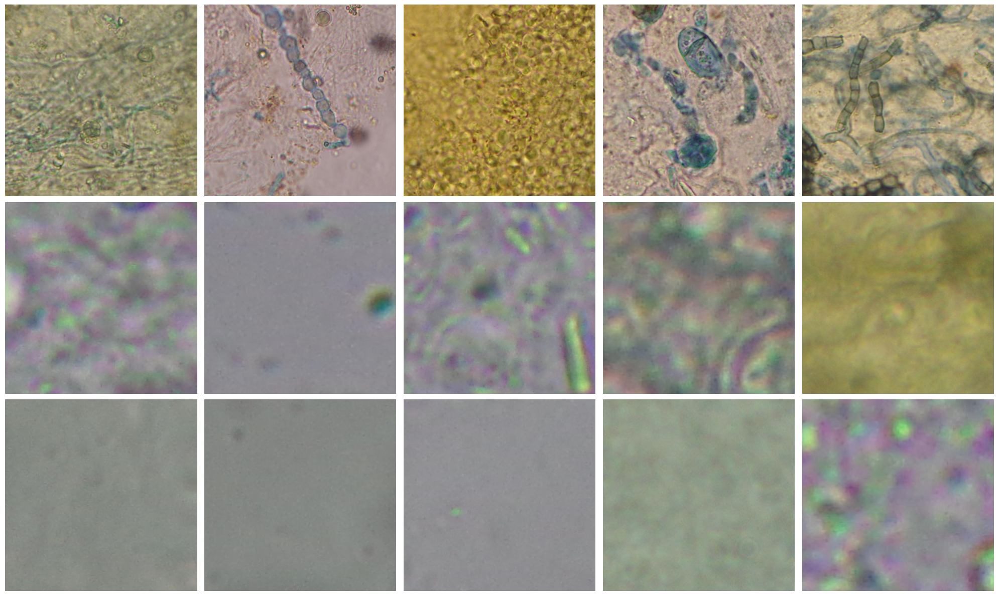

In [5]:
h1_good = get_img('../data/defungi/trainval/H1/H1_224a_1.jpg')
h1_ok = get_img('../data/defungi/trainval/H1/H1_7c_7.jpg')
h1_bad = get_img('../data/defungi/trainval/H1/H1_111a_13.jpg')

h2_good = get_img('../data/defungi/trainval/H2/H2_108a_1.jpg')
h2_ok = get_img('../data/defungi/trainval/H2/H2_13a_8.jpg')
h2_bad = get_img('../data/defungi/trainval/H2/H2_12a_7.jpg')

h3_good = get_img('../data/defungi/trainval/H3/H3_15a_2.jpg')
h3_ok = get_img('../data/defungi/trainval/H3/H3_1a_25.jpg')
h3_bad = get_img('../data/defungi/trainval/H3/H3_1a_31.jpg')

h5_good = get_img('../data/defungi/trainval/H5/H5_14a_3.jpg')
h5_ok = get_img('../data/defungi/trainval/H5/H5_15a_1.jpg')
h5_bad = get_img('../data/defungi/trainval/H5/H5_105a_5.jpg')

h6_good = get_img('../data/defungi/trainval/H6/H6_24a_2.jpg')
h6_ok = get_img('../data/defungi/trainval/H6/H6_70a_5.jpg')
h6_bad = get_img('../data/defungi/trainval/H6/H6_2a_5.jpg')

fig, axes = plt.subplots(nrows=3, ncols=5, figsize=(20, 12))
images = [[h1_good, h2_good, h3_good, h5_good, h6_good],
          [h1_ok, h2_ok, h3_ok, h5_ok, h6_ok],
          [h1_bad, h2_bad, h3_bad, h5_bad, h6_bad]]

for i in range(3):
    for j in range(5):
        axes[i][j].axis('off')
        axes[i][j].imshow(images[i][j])

plt.tight_layout()
plt.show()

The [DeFungi](https://archive.ics.uci.edu/dataset/773/defungi) dataset, used in this project, contains images of microscopic fungi. 

Overall the dataset contains 9114 3-channel RGB images of size 500X500.

Images are labelled into five classes which are unbalanced:
1) Class H1: 4404 samples
2) Class H2: 2334 samples
3) Class H3: 819 samples
4) Class H5: 818 samples
5) Class H6: 739 samples

Significant number of images are of low or poor quality: blurred images, chromatic aberrations, and images containing no objects.

On the figure above 3 samples are given for each of the 5 classes:
1) Top row: examples of good samples
2) Middle row: Examples of low-quality samples
3) Bottom row: Examples of poor-quality samples

Class H6, although the most underrepresented one, contains more high-quality images proportionally than the other classes, while the firts 2 classes - H1 and H2 - are more represented, but have larger portion of low-quality samples.

Images are very diverse in terms scale: some of them capture a large number of fungi, while others zoom-in on just a few fungi. Example of this particularity is demonstrated in the figure below:

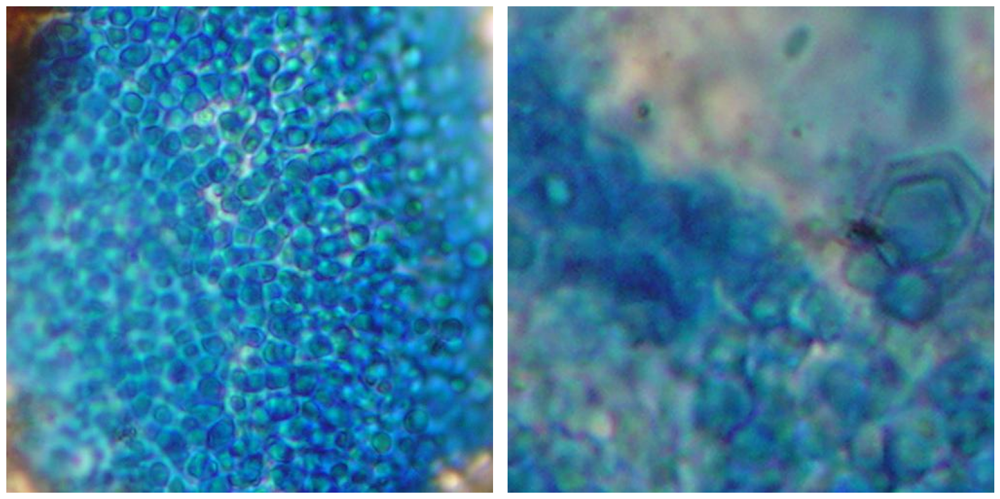

In [6]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(16, 8))

img1 = get_img('../data/defungi/trainval/H3/H3_36a_3.jpg')
img2 = get_img('../data/defungi/trainval/H3/H3_20a_1.jpg')

axes[0].imshow(img1)
axes[1].imshow(img2)
axes[0].axis('off')
axes[1].axis('off')
plt.tight_layout()
plt.show()

In [9]:
FUNGI_ROOT = '../data/defungi/'
EPOCHS = 10
BATCH_SIZE = 16
NUM_WORKERS = 12

SEED = 42
seed_everything(SEED)

transform = transforms.Compose([
    transforms.ToTensor(),
])

The dataset is randomly sampled into train, validation and test subsets:
1) Train: 5922 samples (65%)
2) Validation: 1368 samples (15%)
3) Trainval (train + val for final model training): 7290 samples (80%)
4) Test: 1824 samples (20%)

The main preprocessing step is standardisation, which is carried out by *get_img* function.

Additional preprocessing includes image augmentation for CNN model, which is described in detail in the dedicated section.

In [10]:
# Splits data into train and test subsets
# Copies files into train/ and test/ subdirectories
train_test_split(get_fungi_list(FUNGI_ROOT), 
                 fungi_root=FUNGI_ROOT, 
                 train_end=0.65,
                 val_end=0.80)

[] []
[] []
[] []
[] []
[] []


In [11]:
print('--TRAIN')
train_dataset = FungiDataset(fungi_root=f'{FUNGI_ROOT}train/', 
                             transform=transform)
print('--VAL')
val_dataset = FungiDataset(fungi_root=f'{FUNGI_ROOT}val/', 
                           transform=transform)
print('--TRAINVAL')
trainval_dataset = FungiDataset(fungi_root=f'{FUNGI_ROOT}trainval/', 
                                transform=transform)
print('--TEST')
test_dataset = FungiDataset(fungi_root=f'{FUNGI_ROOT}test/', 
                            transform=transform)

train_dataloader = DataLoader(
    train_dataset,
    batch_size=BATCH_SIZE,
    num_workers=NUM_WORKERS,
    shuffle=True,
    worker_init_fn=seed_worker,
    generator=torch.Generator().manual_seed(SEED),
)
print(f'TRAIN: Dataset size: {len(train_dataset)}')
print(f'TRAIN: Number of iterations per epoch: {len(train_dataloader)}')
val_dataloader = DataLoader(
    val_dataset,
    batch_size=BATCH_SIZE,
    num_workers=NUM_WORKERS,
    shuffle=False,
    worker_init_fn=seed_worker,
    generator=torch.Generator().manual_seed(SEED),
)
print(f'VAL: Dataset size: {len(val_dataset)}')
print(f'VAL: Number of iterations per epoch: {len(val_dataloader)}')
trainval_dataloader = DataLoader(
    trainval_dataset,
    batch_size=BATCH_SIZE,
    num_workers=NUM_WORKERS,
    shuffle=True,
    worker_init_fn=seed_worker,
    generator=torch.Generator().manual_seed(SEED),
)
print(f'TRAINVAL: Dataset size: {len(trainval_dataset)}')
print(f'TRAINVAL: Number of iterations per epoch: {len(trainval_dataloader)}')
test_dataloader = DataLoader(
    test_dataset,
    batch_size=BATCH_SIZE,
    num_workers=NUM_WORKERS,
    shuffle=False,
    worker_init_fn=seed_worker,
    generator=torch.Generator().manual_seed(SEED),
)
print(f'TEST: Dataset size: {len(test_dataset)}')
print(f'TEST: Number of iterations per epoch: {len(test_dataloader)}')


--TRAIN
Class 0: 2862 samples
Class 1: 1517 samples
Class 2: 532 samples
Class 3: 531 samples
Class 4: 480 samples
--VAL
Class 0: 661 samples
Class 1: 350 samples
Class 2: 123 samples
Class 3: 123 samples
Class 4: 111 samples
--TRAINVAL
Class 0: 3523 samples
Class 1: 1867 samples
Class 2: 655 samples
Class 3: 654 samples
Class 4: 591 samples
--TEST
Class 0: 881 samples
Class 1: 467 samples
Class 2: 164 samples
Class 3: 164 samples
Class 4: 148 samples
TRAIN: Dataset size: 5922
TRAIN: Number of iterations per epoch: 371
VAL: Dataset size: 1368
VAL: Number of iterations per epoch: 86
TRAINVAL: Dataset size: 7290
TRAINVAL: Number of iterations per epoch: 456
TEST: Dataset size: 1824
TEST: Number of iterations per epoch: 114


Feature batch shape: torch.Size([16, 3, 500, 500])
Labels batch shape: torch.Size([16])


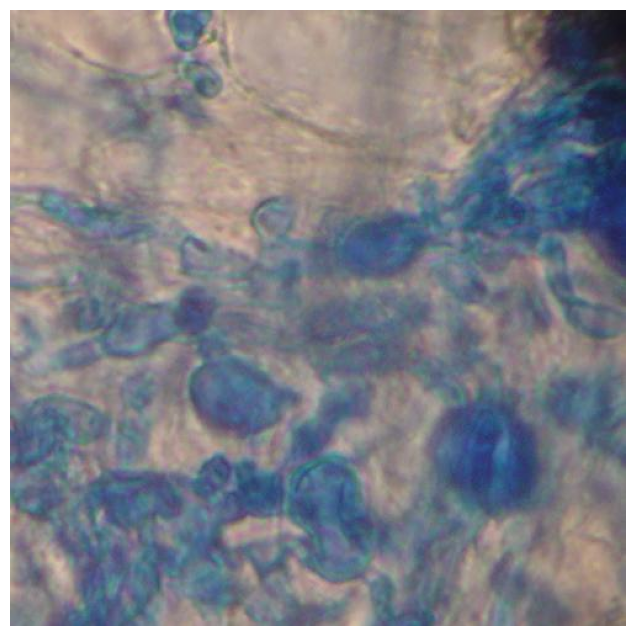

In [12]:
idx = 3
train_features, train_labels = next(iter(trainval_dataloader))
print(f"Feature batch shape: {train_features.size()}")
print(f"Labels batch shape: {train_labels.size()}")
img = train_features[idx].squeeze()
label = train_labels[idx]

show_img(img)

## 4. Technique (part 1)

### a) Discuss your motivation for choosing the technique and provide a schematic figure of the process (8 marks)

100-200 words


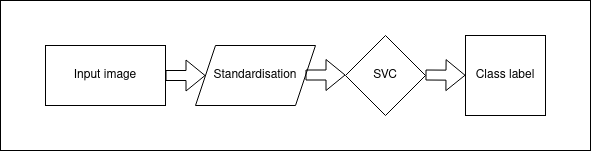

The first technique chosen is the Support Vector Machine classifier, which is a widely used approach for classification tasks.

Although it is implemented in *scikit-learn* library, pytorch implementation is used here. The reason for this is that *sklearn* implementation of SVM requires all data to be fed into the model simultaniously and computations are conducted in float64 format, resulting in 33GB RAM requirements for SVM training. Pytorch implementation provided uses Linear layer in combination with MultiMarginLoss (hinge loss) and L2 regularisation and is optimised using Stochastic Gradient Descent. Mini-batch training might not lead to the same result, but is much more affordable in terms of computational resources.

Model training and evaluating functions

In [14]:
class SVM(nn.Module):
    def __init__(self, input_size, num_classes, c):
        super().__init__()
        self.c = c
        self.fc = nn.Linear(input_size, num_classes)

    def forward(self, x):
        x = torch.flatten(x, 1)
        return self.fc(x)
    

def train_run_svm(model_,
                  epochs_,
                  lr,
                  train_dataloader_,
                  print_every_n_minibatches=100):
    optimizer = torch.optim.SGD(model_.parameters(), lr=lr)
    criterion = torch.nn.MultiMarginLoss()

    for epoch in range(epochs_):
        running_loss = 0.0
        for i, (images, labels) in enumerate(train_dataloader_, 0):
            images = images.to('cuda', dtype=torch.float)
            labels = labels.to('cuda', dtype=torch.int64)

            optimizer.zero_grad()
            predictions = model_(images)
            loss = criterion(input=predictions, target=labels)
            
            w = model_.fc.weight.squeeze()
            loss += model_.c * (w**2).sum() / 2.0

            loss.backward()
            optimizer.step()
            running_loss += loss.item()

            if not(i % print_every_n_minibatches) and i:
                print(f'EPOCH {epoch}: TRAIN_LOSS={running_loss/(i + 1):.5f}')


def predict(model_, dataloader):
    y_true = []
    y_pred = []

    model_.eval()
    with torch.no_grad():
        for images, labels in dataloader:
            images = images.to('cuda', dtype=torch.float)
            labels = labels.to('cuda', dtype=torch.int64)

            predictions = model_(images)
            _, predictions = torch.max(predictions.data, dim=1)
            
            predictions = predictions.to('cpu').detach().numpy()
            labels = labels.to('cpu').detach().numpy()
            
            y_pred.append(predictions)
            y_true.append(labels)        

    y_true = np.concatenate(y_true)
    y_pred = np.concatenate(y_pred)
    return y_pred, y_true


def performance_measures(y_true, y_pred,
                         print_=False,
                         confusion_mat=False,
                         cls_report=False):

    pr = precision_score(y_true=y_true, y_pred=y_pred, average='macro')
    re = recall_score(y_true=y_true, y_pred=y_pred, average='macro')

    if print_:
        print(f'Precision: {pr}')
        print(f'Recall: {re}')
    if confusion_mat:
        cm = confusion_matrix(y_true=y_true, y_pred=y_pred)
        cmd = ConfusionMatrixDisplay(confusion_matrix=cm)
        cmd.plot()
        plt.show()
    if cls_report:
        crep = classification_report(y_true=y_true, y_pred=y_pred)
        print(crep)


### b) Setting hyper parameters (rationale) (5 marks)


Commonly used values of learning rate for SGD optimiser and C hyper-parameter for SVM (lr=0.001, c=1.0) are examined in the cells below.

In [19]:
svm = SVM(input_size=3*500**2, 
          num_classes=5, 
          c=1.0).to('cuda')

In [20]:
train_run_svm(svm,
              epochs_=10,
              lr=0.001,
              train_dataloader_=train_dataloader,
              print_every_n_minibatches=100)

EPOCH 0: TRAIN_LOSS=6.64442
EPOCH 0: TRAIN_LOSS=6.27365
EPOCH 0: TRAIN_LOSS=6.13662
EPOCH 1: TRAIN_LOSS=5.36485
EPOCH 1: TRAIN_LOSS=5.48518
EPOCH 1: TRAIN_LOSS=5.57834
EPOCH 2: TRAIN_LOSS=5.12383
EPOCH 2: TRAIN_LOSS=4.99387
EPOCH 2: TRAIN_LOSS=5.09149
EPOCH 3: TRAIN_LOSS=4.46364
EPOCH 3: TRAIN_LOSS=4.71654
EPOCH 3: TRAIN_LOSS=4.78183
EPOCH 4: TRAIN_LOSS=4.86246
EPOCH 4: TRAIN_LOSS=4.77305
EPOCH 4: TRAIN_LOSS=4.99599
EPOCH 5: TRAIN_LOSS=4.97049
EPOCH 5: TRAIN_LOSS=4.96132
EPOCH 5: TRAIN_LOSS=4.96485
EPOCH 6: TRAIN_LOSS=5.24165
EPOCH 6: TRAIN_LOSS=4.99356
EPOCH 6: TRAIN_LOSS=4.94146
EPOCH 7: TRAIN_LOSS=4.79627
EPOCH 7: TRAIN_LOSS=4.89891
EPOCH 7: TRAIN_LOSS=5.06086
EPOCH 8: TRAIN_LOSS=5.20637
EPOCH 8: TRAIN_LOSS=4.78837
EPOCH 8: TRAIN_LOSS=4.87064
EPOCH 9: TRAIN_LOSS=5.19333
EPOCH 9: TRAIN_LOSS=4.78691
EPOCH 9: TRAIN_LOSS=4.75092


In [21]:
y_pred, y_true = predict(svm, train_dataloader)

Precision: 0.13581935890437058
Recall: 0.2350532581453634


/home/sibeard/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


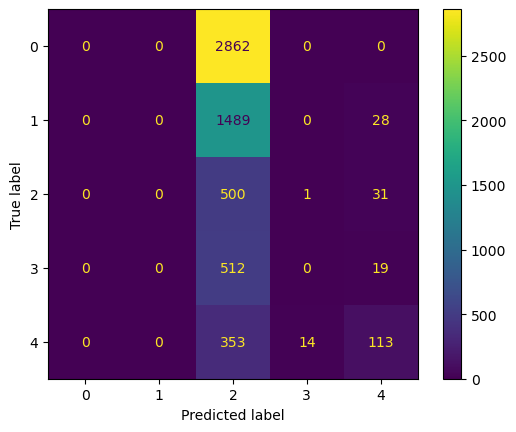

              precision    recall  f1-score   support

           0       0.00      0.00      0.00      2862
           1       0.00      0.00      0.00      1517
           2       0.09      0.94      0.16       532
           3       0.00      0.00      0.00       531
           4       0.59      0.24      0.34       480

    accuracy                           0.10      5922
   macro avg       0.14      0.24      0.10      5922
weighted avg       0.06      0.10      0.04      5922



/home/sibeard/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/sibeard/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/sibeard/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [22]:
performance_measures(y_true, y_pred,
                     print_=True,
                     confusion_mat=True,
                     cls_report=True)

In [23]:
y_pred, y_true = predict(svm, val_dataloader)

Precision: 0.14499544764795144
Recall: 0.23977147879586905


/home/sibeard/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


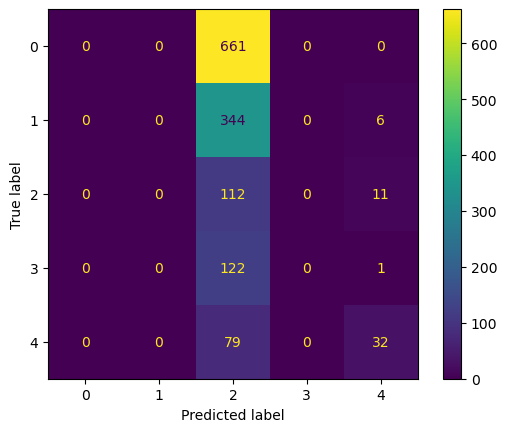

              precision    recall  f1-score   support

           0       0.00      0.00      0.00       661
           1       0.00      0.00      0.00       350
           2       0.08      0.91      0.16       123
           3       0.00      0.00      0.00       123
           4       0.64      0.29      0.40       111

    accuracy                           0.11      1368
   macro avg       0.14      0.24      0.11      1368
weighted avg       0.06      0.11      0.05      1368



/home/sibeard/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/sibeard/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/sibeard/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [24]:
performance_measures(y_true, y_pred,
                         print_=True,
                         confusion_mat=True,
                         cls_report=True)

The SVM model shows good precision on class H5, but otherwise fails. The gridsearch for hyper-parameters lr and C is carried out in the next sub-section.

### c) Optimising hyper parameters (5 marks) 


In [26]:
for lr in [0.0001, 0.001, 0.01]:
    for c in [2.0, 1.0, 0.5]:
        print(f'lr={lr}, c={c}')
        svm = SVM(input_size=3*500**2, 
                  num_classes=5, 
                  c=c).to('cuda')
        train_run_svm(svm,
                      epochs_=5,
                      lr=lr,
                      train_dataloader_=train_dataloader,
                      print_every_n_minibatches=10000)
        y_pred, y_true = predict(svm, train_dataloader)
        print('Train metrics')
        performance_measures(y_true, y_pred,
                             print_=True,
                             confusion_mat=False,
                             cls_report=False)
        y_pred, y_true = predict(svm, val_dataloader)
        print('Val metrics')
        performance_measures(y_true, y_pred,
                             print_=True,
                             confusion_mat=False,
                             cls_report=False)

lr=0.0001, c=2.0
Train metrics
Precision: 0.23227264677946455
Recall: 0.275


/home/sibeard/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Val metrics
Precision: 0.23713879266345952
Recall: 0.2864864864864865
lr=0.0001, c=1.0


/home/sibeard/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Train metrics
Precision: 0.3276048395601482
Recall: 0.3313302313586973


/home/sibeard/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Val metrics
Precision: 0.3475808770456944
Recall: 0.340589539763002
lr=0.0001, c=0.5


/home/sibeard/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Train metrics
Precision: 0.2513454053139279
Recall: 0.20249999999999999


/home/sibeard/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Val metrics
Precision: 0.05116959064327485
Recall: 0.2
lr=0.001, c=2.0


/home/sibeard/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Train metrics
Precision: 0.21861043817725706
Recall: 0.24916666666666668


/home/sibeard/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Val metrics
Precision: 0.23023845763571787
Recall: 0.26306306306306304
lr=0.001, c=1.0


/home/sibeard/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Train metrics
Precision: 0.23758275487213804
Recall: 0.29


/home/sibeard/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Val metrics
Precision: 0.23390092879256966
Recall: 0.2900900900900901
lr=0.001, c=0.5


/home/sibeard/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Train metrics
Precision: 0.23200254337172516
Recall: 0.27458333333333335


/home/sibeard/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Val metrics
Precision: 0.23533950617283947
Recall: 0.2864864864864865
lr=0.01, c=2.0


/home/sibeard/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Train metrics
Precision: 0.05123269165822357
Recall: 0.2


/home/sibeard/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Val metrics
Precision: 0.05116959064327485
Recall: 0.2
lr=0.01, c=1.0


/home/sibeard/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Train metrics
Precision: 0.017933130699088147
Recall: 0.2


/home/sibeard/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Val metrics
Precision: 0.017982456140350878
Recall: 0.2
lr=0.01, c=0.5


/home/sibeard/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Train metrics
Precision: 0.21871104321003534
Recall: 0.2520833333333333


/home/sibeard/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Val metrics
Precision: 0.22795818043342794
Recall: 0.26306306306306304


/home/sibeard/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [28]:
lr=0.00001
c=1.0

svm = SVM(input_size=3*500**2, 
            num_classes=5, 
            c=c).to('cuda')
train_run_svm(svm,
              epochs_=10,
              lr=lr,
              train_dataloader_=train_dataloader,
              print_every_n_minibatches=100)
y_pred, y_true = predict(svm, train_dataloader)
print('Train metrics')
performance_measures(y_true, y_pred,
                        print_=True,
                        confusion_mat=False,
                        cls_report=False)
y_pred, y_true = predict(svm, val_dataloader)
print('Val metrics')
performance_measures(y_true, y_pred,
                        print_=True,
                        confusion_mat=False,
                        cls_report=False)

EPOCH 0: TRAIN_LOSS=1.31572
EPOCH 0: TRAIN_LOSS=1.30154
EPOCH 0: TRAIN_LOSS=1.28985
EPOCH 1: TRAIN_LOSS=1.24586
EPOCH 1: TRAIN_LOSS=1.25329
EPOCH 1: TRAIN_LOSS=1.24668
EPOCH 2: TRAIN_LOSS=1.22230
EPOCH 2: TRAIN_LOSS=1.22978
EPOCH 2: TRAIN_LOSS=1.23240
EPOCH 3: TRAIN_LOSS=1.21329
EPOCH 3: TRAIN_LOSS=1.21684
EPOCH 3: TRAIN_LOSS=1.21159
EPOCH 4: TRAIN_LOSS=1.21601
EPOCH 4: TRAIN_LOSS=1.19928
EPOCH 4: TRAIN_LOSS=1.19923
EPOCH 5: TRAIN_LOSS=1.20422
EPOCH 5: TRAIN_LOSS=1.19392
EPOCH 5: TRAIN_LOSS=1.18815
EPOCH 6: TRAIN_LOSS=1.18481
EPOCH 6: TRAIN_LOSS=1.18038
EPOCH 6: TRAIN_LOSS=1.18093
EPOCH 7: TRAIN_LOSS=1.19900
EPOCH 7: TRAIN_LOSS=1.18791
EPOCH 7: TRAIN_LOSS=1.18222
EPOCH 8: TRAIN_LOSS=1.15775
EPOCH 8: TRAIN_LOSS=1.16879
EPOCH 8: TRAIN_LOSS=1.16985
EPOCH 9: TRAIN_LOSS=1.16864
EPOCH 9: TRAIN_LOSS=1.16559
EPOCH 9: TRAIN_LOSS=1.16418
Train metrics
Precision: 0.38631634114883745
Recall: 0.3223962422490974


/home/sibeard/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Val metrics
Precision: 0.4140850009981709
Recall: 0.3322840496038533


/home/sibeard/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [29]:
lr=0.000005
c=1.0

svm = SVM(input_size=3*500**2, 
            num_classes=5, 
            c=c).to('cuda')
train_run_svm(svm,
              epochs_=10,
              lr=lr,
              train_dataloader_=train_dataloader,
              print_every_n_minibatches=300)
y_pred, y_true = predict(svm, train_dataloader)
print('Train metrics')
performance_measures(y_true, y_pred,
                        print_=True,
                        confusion_mat=False,
                        cls_report=False)
y_pred, y_true = predict(svm, val_dataloader)
print('Val metrics')
performance_measures(y_true, y_pred,
                        print_=True,
                        confusion_mat=False,
                        cls_report=False)

EPOCH 0: TRAIN_LOSS=1.30291
EPOCH 1: TRAIN_LOSS=1.26449
EPOCH 2: TRAIN_LOSS=1.24082
EPOCH 3: TRAIN_LOSS=1.24034
EPOCH 4: TRAIN_LOSS=1.22262
EPOCH 5: TRAIN_LOSS=1.21610
EPOCH 6: TRAIN_LOSS=1.20924
EPOCH 7: TRAIN_LOSS=1.20214
EPOCH 8: TRAIN_LOSS=1.19237
EPOCH 9: TRAIN_LOSS=1.19308
Train metrics
Precision: 0.23151571787250075
Recall: 0.3312473794549266


/home/sibeard/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Val metrics
Precision: 0.22920047967412618
Recall: 0.34023796867972356


/home/sibeard/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Decreasing learning rate even further resulted in degraded performance, so the final values are chosen as lr=0.00001, c=1.0

### d) Performance metrics for training (5 marks)

Now the model is trained on the whole training set (trainval) with best hyper-parameters, and performance metrics are calculated for it.

Train metrics
Precision: 0.260913415400213
Recall: 0.3155918700365913


/home/sibeard/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


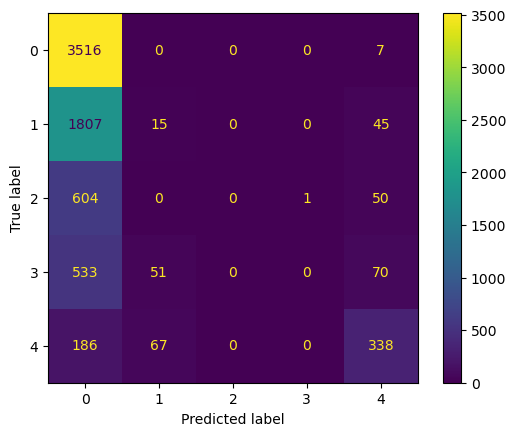

              precision    recall  f1-score   support

           0       0.53      1.00      0.69      3523
           1       0.11      0.01      0.01      1867
           2       0.00      0.00      0.00       655
           3       0.00      0.00      0.00       654
           4       0.66      0.57      0.61       591

    accuracy                           0.53      7290
   macro avg       0.26      0.32      0.26      7290
weighted avg       0.34      0.53      0.39      7290



/home/sibeard/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/sibeard/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/sibeard/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [30]:
lr=0.00001
c=1.0

svm = SVM(input_size=3*500**2, 
          num_classes=5, 
          c=c).to('cuda')
train_run_svm(svm,
              epochs_=10,
              lr=lr,
              train_dataloader_=trainval_dataloader,
              print_every_n_minibatches=500)
y_pred, y_true = predict(svm, trainval_dataloader)
print('Train metrics')
performance_measures(y_true, y_pred,
                     print_=True,
                     confusion_mat=True,
                     cls_report=True)

The final SVM model has relatively good precision and recall on class H5, but missclassifies the majority of samples as class H1, which is can be explained by the fact that this class is the most represented one.

## 5. Technique (part 2)

### a) Discuss your motivation for choosing the technique and  provide a schematic figure of the process (8 marks)


The second technique chosen is a Convolutional Neural Network, which is a widely used deep learning approach to image processing problems.

Model training and evaluating functions

In [33]:
def train_run(model_,
              optimizer_,
              criterion_,
              epochs_, 
              train_dataloader_,
              val_dataloader_,
              val_every_n_minibatches=100):
    history = {
        'train_loss': [],
        'val_loss': [],
    }

    model_.train()
    for epoch in range(epochs_):
        running_loss = 0.0

        for i, (images, labels) in enumerate(train_dataloader_, 0):
            images = images.to('cuda', dtype=torch.float)
            labels = labels.to('cuda', dtype=torch.int64)

            optimizer_.zero_grad()

            predictions = model_(images)
            loss = criterion_(input=predictions, target=labels)
            loss.backward()
            optimizer_.step()

            running_loss += loss.item()

            # Validate every val_every_n_minibatches mini-batches
            if not(i % val_every_n_minibatches) and i:
                model_.eval()
                with torch.no_grad():
                    val_loss = 0.0
                    for j, (val_images, val_labels) in enumerate(val_dataloader_, 0):
                        val_images = val_images.to('cuda', dtype=torch.float)
                        val_labels = val_labels.to('cuda', dtype=torch.int64)
                        val_predictions = model_(val_images)
                        loss = criterion_(input=val_predictions, target=val_labels)
                        val_loss += loss.item()
                val_loss /= len(val_dataloader_)
                history['val_loss'].append(val_loss)
                history['train_loss'].append(running_loss/(i + 1))
                print(f'EPOCH {epoch}: TRAIN_LOSS={running_loss/(i + 1):.5f}'
                      + f' VAL_LOSS={val_loss:.5f}')
                model_.train()

    return history


def plot_train_val_loss(history):
    plt.plot(np.arange(len(history['train_loss'])),
             history['train_loss'], 
             label='Train Loss')
    plt.plot(np.arange(len(history['val_loss'])),
             history['val_loss'], 
             label='Val Loss')
    plt.legend()
    plt.show()
    

CNN class implementation

The CNN architecture implemented consists of 7 convolutional layers with ReLU activation and MaxPooling 2x2. This layers act as feature extractor for the last 2 fully connected layers. The number of kernels in convolutional filters is increased along the way from 8 to 128, the idea here is to increase number of feature maps for richer representation. Feachures from the last convolutional layer are stretched into one feature vector, which is the input to the first fully-connected layer with ReLU activation. The number of neurons in this layer will be one of hyper-parameters to explore. The second fully-connected layer is the output with 5 units.

The second hyper-parameter to explore is the kernel size for convolutional layers. Features on the images in the DeFungi dataset vary greatly, hence kernel size might be worth exploring.

Cross-entropy loss is chosen for a loss function, since it is appropriate for the task. For the optimisation, Adam algorithm is used, which is a common choice for deep learning optimisation problems. Learning rate for Adam optimiser is another hyper-parameter that will be explored.

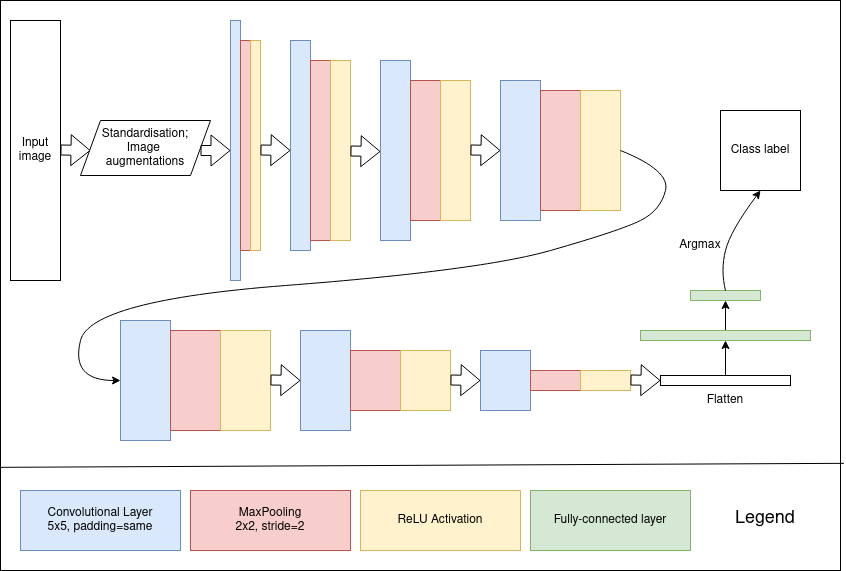

In [34]:
class ConvNet(nn.Module):
    def __init__(self, fc_size=256, k_size=3):
        super().__init__()
        self.conv1 = self.conv(in_channels=3, out_channels=8, k_size=k_size)
        self.conv2 = self.conv(in_channels=8, out_channels=16, k_size=k_size)
        self.conv3 = self.conv(in_channels=16, out_channels=32, k_size=k_size)
        self.conv4 = self.conv(in_channels=32, out_channels=64, k_size=k_size)
        self.conv5 = self.conv(in_channels=64, out_channels=128, k_size=k_size)
        self.conv6 = self.conv(in_channels=128, out_channels=128, k_size=k_size)
        self.conv7 = self.conv(in_channels=128, out_channels=128, k_size=k_size)
        
        self.pool = nn.MaxPool2d(kernel_size=2, stride=2)

        self.fc1 = nn.Linear(3**2 * 128, fc_size)
        self.fc2 = nn.Linear(fc_size, 5)
    
    def conv(self, in_channels, out_channels, k_size):
        return nn.Conv2d(in_channels=in_channels,
                         out_channels= out_channels,
                         kernel_size=k_size, 
                         padding='same')
    
    def forward(self, x):
        x = self.pool(F.relu(self.conv1(x)))
        x = self.pool(F.relu(self.conv2(x)))
        x = self.pool(F.relu(self.conv3(x)))
        x = self.pool(F.relu(self.conv4(x)))
        x = self.pool(F.relu(self.conv5(x)))
        x = self.pool(F.relu(self.conv6(x)))
        x = self.pool(F.relu(self.conv7(x)))
        x = torch.flatten(x, 1)
        x = F.relu(self.fc1(x))
        x = self.fc2(x)
        return x
        

### b) Setting hyper parameters (rationale) (5 marks)


First, hyper-parameters are set as follows:
1) Fully-connected layer size, fc_size=256 - to start with a simpler model
2) Kernel size, k_size=3 - most commonly used kernel size for convolutional layers
3) Learning rate, lr=0.001 - the default value for Adam optimiser

In [35]:
fc_size=256
k_size=3
lr=0.001

cnn = ConvNet(fc_size=fc_size, k_size=k_size).to('cuda')
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(cnn.parameters(), 
                             lr=lr,
                             amsgrad=True)


In [36]:
history = train_run(cnn,
                    optimizer,
                    criterion,
                    epochs_=5, 
                    train_dataloader_=train_dataloader,
                    val_dataloader_=val_dataloader,
                    val_every_n_minibatches=200)

EPOCH 0: TRAIN_LOSS=1.36070 VAL_LOSS=1.31922
EPOCH 1: TRAIN_LOSS=1.14806 VAL_LOSS=1.03921
EPOCH 2: TRAIN_LOSS=1.00573 VAL_LOSS=1.02299
EPOCH 3: TRAIN_LOSS=1.00254 VAL_LOSS=0.96540
EPOCH 4: TRAIN_LOSS=0.96392 VAL_LOSS=0.92374


TRAIN PERFORMANCE
Precision: 0.5639033144191545
Recall: 0.5117865956490854


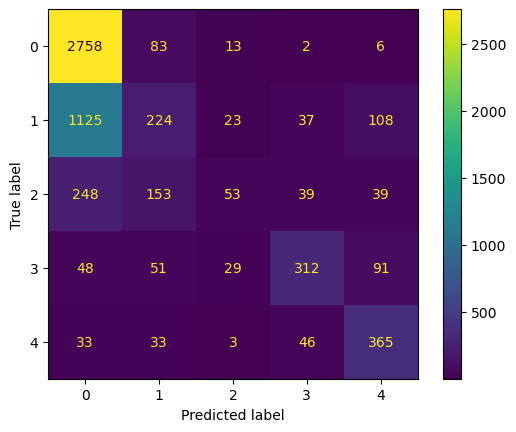

              precision    recall  f1-score   support

           0       0.65      0.96      0.78      2862
           1       0.41      0.15      0.22      1517
           2       0.44      0.10      0.16       532
           3       0.72      0.59      0.65       531
           4       0.60      0.76      0.67       480

    accuracy                           0.63      5922
   macro avg       0.56      0.51      0.50      5922
weighted avg       0.57      0.63      0.56      5922

VAL PERFORMANCE
Precision: 0.5638906352268421
Recall: 0.5357958441080097


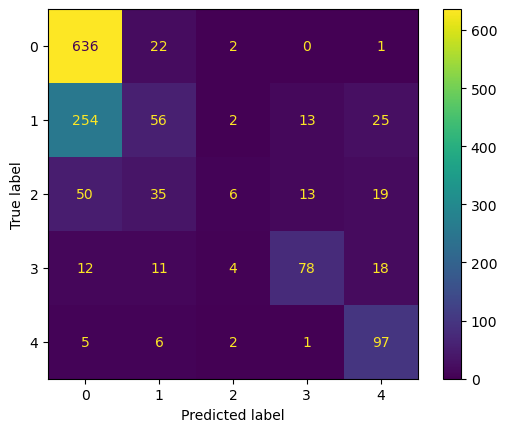

              precision    recall  f1-score   support

           0       0.66      0.96      0.79       661
           1       0.43      0.16      0.23       350
           2       0.38      0.05      0.09       123
           3       0.74      0.63      0.68       123
           4       0.61      0.87      0.72       111

    accuracy                           0.64      1368
   macro avg       0.56      0.54      0.50      1368
weighted avg       0.58      0.64      0.57      1368



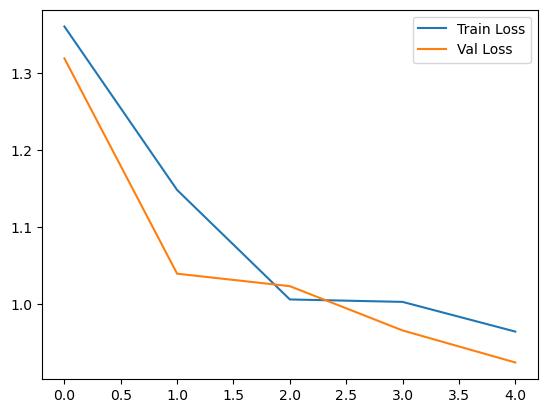

In [38]:
y_pred, y_true = predict(cnn, train_dataloader)
print('TRAIN PERFORMANCE')
performance_measures(y_true=y_true,
                     y_pred=y_pred,
                     print_=True,
                     confusion_mat=True,
                     cls_report=True)

y_pred, y_true = predict(cnn, val_dataloader)
print('VAL PERFORMANCE')
performance_measures(y_true=y_true,
                     y_pred=y_pred,
                     print_=True,
                     confusion_mat=True,
                     cls_report=True)

plot_train_val_loss(history)

CNN model performs much better, but still missclassifies a lot of samles as class H1.

### c) Optimising hyper parameters (5 marks)


In the next cell grid search is executed to search for values of the following hyper-parameters:
* Fully-connected layer size
* Kernel size for convolutional filters
* Learning rate for the optimiser

In [43]:
epochs = 5

for fc_size in [128, 256, 512]:
    for k_size in [3, 5]:
        for lr in [0.001, 0.0001]:
            print(f'fc_size={fc_size}, k_size={k_size}, lr={lr}')
            cnn = ConvNet(fc_size=fc_size, k_size=k_size).to('cuda')
            criterion = nn.CrossEntropyLoss()
            optimizer = torch.optim.Adam(cnn.parameters(), 
                                         lr=lr,
                                         amsgrad=True)
            history = train_run(cnn,
                                optimizer,
                                criterion,
                                epochs_=epochs, 
                                train_dataloader_=train_dataloader,
                                val_dataloader_=val_dataloader,
                                val_every_n_minibatches=2000)
            
            y_pred, y_true = predict(cnn, train_dataloader)
            print('train performance')
            performance_measures(y_true=y_true,
                                y_pred=y_pred,
                                print_=True,
                                confusion_mat=False,
                                cls_report=False)

            y_pred, y_true = predict(cnn, val_dataloader)
            print('val performance')
            performance_measures(y_true=y_true,
                                y_pred=y_pred,
                                print_=True,
                                confusion_mat=False,
                                cls_report=False)


fc_size=128, k_size=3, lr=0.001


train performance
Precision: 0.6142020801880805
Recall: 0.5400866778977712
val performance
Precision: 0.4487477594601831
Recall: 0.5416656665943408
fc_size=128, k_size=3, lr=0.0001
train performance
Precision: 0.4513488004928391
Recall: 0.41136109770896984
val performance
Precision: 0.4037664433765351
Recall: 0.4179999636233724
fc_size=128, k_size=5, lr=0.001
train performance
Precision: 0.5413993128222941
Recall: 0.5375127191644097
val performance
Precision: 0.5305945072179317
Recall: 0.5447461697334395
fc_size=128, k_size=5, lr=0.0001
train performance
Precision: 0.4474338041570004
Recall: 0.4214337171508202
val performance
Precision: 0.3974248348835215
Recall: 0.44319778214645567
fc_size=256, k_size=3, lr=0.001
train performance
Precision: 0.4200260598499992
Recall: 0.4859580632817956


/home/sibeard/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


val performance
Precision: 0.41613946841436944
Recall: 0.4982221718204892
fc_size=256, k_size=3, lr=0.0001


/home/sibeard/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


train performance
Precision: 0.426418370345716
Recall: 0.445591687766764


/home/sibeard/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


val performance
Precision: 0.4249543565454485
Recall: 0.45878119529704336
fc_size=256, k_size=5, lr=0.001


/home/sibeard/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


train performance
Precision: 0.09665653495440729
Recall: 0.2


/home/sibeard/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


val performance
Precision: 0.0966374269005848
Recall: 0.2
fc_size=256, k_size=5, lr=0.0001


/home/sibeard/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


train performance
Precision: 0.5401274815423438
Recall: 0.5283825336400715
val performance
Precision: 0.5919251908222496
Recall: 0.5446811171157874
fc_size=512, k_size=3, lr=0.001
train performance
Precision: 0.4652040377070656
Recall: 0.4897995525789347


/home/sibeard/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


val performance
Precision: 0.46478278373279025
Recall: 0.49772149797432996
fc_size=512, k_size=3, lr=0.0001


/home/sibeard/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


train performance
Precision: 0.5082359651335505
Recall: 0.4240649496199612
val performance
Precision: 0.42062870977819433
Recall: 0.4513452740800809
fc_size=512, k_size=5, lr=0.001


/home/sibeard/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


train performance
Precision: 0.09665653495440729
Recall: 0.2


/home/sibeard/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


val performance
Precision: 0.0966374269005848
Recall: 0.2
fc_size=512, k_size=5, lr=0.0001


/home/sibeard/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


train performance
Precision: 0.5699656656692655
Recall: 0.5432828088485484
val performance
Precision: 0.540686083366349
Recall: 0.5437972925246458


Best hyper-parameters:
* fc_size=256
* k_size=5
* lr=0.0001

Metrics:
* Train Precision: 0.5401274815423438
* Train Recall: 0.5283825336400715
* Val Precision: 0.5919251908222496
* Val Recall: 0.5446811171157874

Increasing kernel size to 7 results in worse performance:

In [44]:
fc_size=256
k_size=7
lr=0.0001

print(f'fc_size={fc_size}, k_size={k_size}, lr={lr}')
cnn = ConvNet(fc_size=fc_size, k_size=k_size).to('cuda')
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(cnn.parameters(), 
                                lr=lr,
                                amsgrad=True)
history = train_run(cnn,
                    optimizer,
                    criterion,
                    epochs_=epochs, 
                    train_dataloader_=train_dataloader,
                    val_dataloader_=val_dataloader,
                    val_every_n_minibatches=2000)

y_pred, y_true = predict(cnn, train_dataloader)
print('train performance')
performance_measures(y_true=y_true,
                    y_pred=y_pred,
                    print_=True,
                    confusion_mat=False,
                    cls_report=False)

y_pred, y_true = predict(cnn, val_dataloader)
print('val performance')
performance_measures(y_true=y_true,
                    y_pred=y_pred,
                    print_=True,
                    confusion_mat=False,
                    cls_report=False)


fc_size=256, k_size=7, lr=0.0001
train performance
Precision: 0.4739577172270641
Recall: 0.47200901204229806
val performance
Precision: 0.4736633790178166
Recall: 0.48023484009978973


/home/sibeard/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


More detailed performance report for best model (performance might be different from previous run with the same hyper-parameters, as CUDA's algorithms for neural networks training are not fully deterministic, which can be fixed but might result in much slower training):

fc_size=256, k_size=5, lr=0.0001


train performance
Precision: 0.34484025314317657
Recall: 0.3963630855441463


/home/sibeard/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


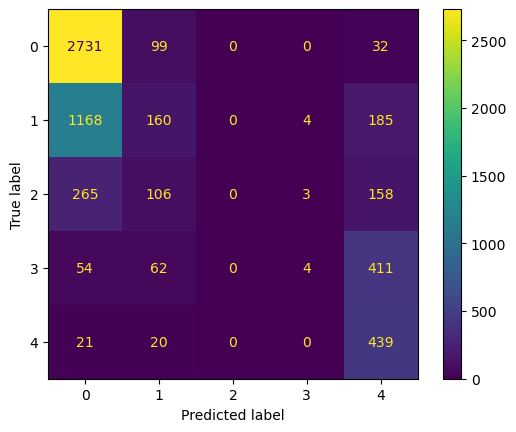

              precision    recall  f1-score   support

           0       0.64      0.95      0.77      2862
           1       0.36      0.11      0.16      1517
           2       0.00      0.00      0.00       532
           3       0.36      0.01      0.01       531
           4       0.36      0.91      0.51       480

    accuracy                           0.56      5922
   macro avg       0.34      0.40      0.29      5922
weighted avg       0.46      0.56      0.46      5922



/home/sibeard/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/sibeard/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/sibeard/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


val performance
Precision: 0.33790698883579323
Recall: 0.40500446487487557


/home/sibeard/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


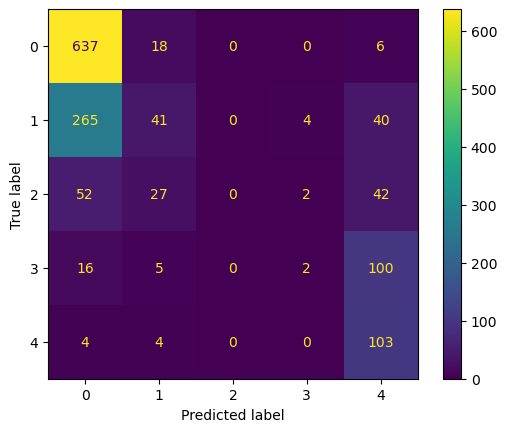

              precision    recall  f1-score   support

           0       0.65      0.96      0.78       661
           1       0.43      0.12      0.18       350
           2       0.00      0.00      0.00       123
           3       0.25      0.02      0.03       123
           4       0.35      0.93      0.51       111

    accuracy                           0.57      1368
   macro avg       0.34      0.41      0.30      1368
weighted avg       0.48      0.57      0.47      1368



/home/sibeard/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/sibeard/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/sibeard/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [46]:
fc_size=256
k_size=5
lr=0.0001

print(f'fc_size={fc_size}, k_size={k_size}, lr={lr}')
cnn = ConvNet(fc_size=fc_size, k_size=k_size).to('cuda')
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(cnn.parameters(), 
                             lr=lr,
                             amsgrad=True)
history = train_run(cnn,
                    optimizer,
                    criterion,
                    epochs_=epochs, 
                    train_dataloader_=train_dataloader,
                    val_dataloader_=val_dataloader,
                    val_every_n_minibatches=2000)

y_pred, y_true = predict(cnn, train_dataloader)
print('train performance')
performance_measures(y_true=y_true,
                    y_pred=y_pred,
                    print_=True,
                    confusion_mat=True,
                    cls_report=True)

y_pred, y_true = predict(cnn, val_dataloader)
print('val performance')
performance_measures(y_true=y_true,
                    y_pred=y_pred,
                    print_=True,
                    confusion_mat=True,
                    cls_report=True)


The problem of unbalanced classes still has significant influence, with best model missclassifying samples as class H1.

Simple duplication of images from underrepresented classes to balance the data gives some improvement:

In [47]:
print('--TRAIN')
train_dataset = FungiDataset(fungi_root=f'{FUNGI_ROOT}train/',
                             balance=True,  # when this parameter is True,
                                            # images in underrepresented classes
                                            # are duplicated to balance the data
                             transform=transform)

train_dataloader = DataLoader(
    train_dataset,
    batch_size=BATCH_SIZE,
    num_workers=NUM_WORKERS,
    shuffle=True,
    worker_init_fn=seed_worker,
    generator=torch.Generator().manual_seed(SEED),
)
print(f'TRAIN: Dataset size: {len(train_dataset)}')
print(f'TRAIN: Number of iterations per epoch: {len(train_dataloader)}')

--TRAIN
Class 0: 2862 samples
Class 1: 2862 samples
Class 2: 2862 samples
Class 3: 2862 samples
Class 4: 2862 samples
TRAIN: Dataset size: 14310
TRAIN: Number of iterations per epoch: 895


fc_size=256, k_size=5, lr=0.0001
train performance
Precision: 0.6452107837497915
Recall: 0.6246680642907059


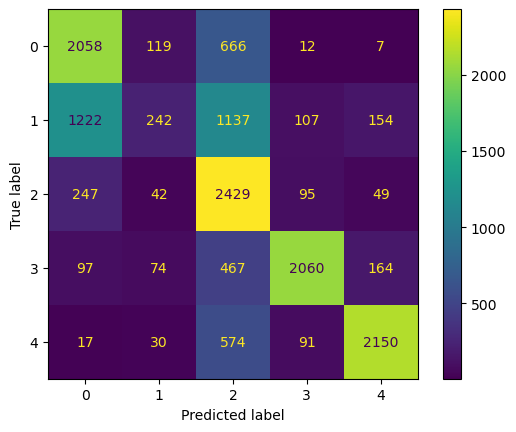

              precision    recall  f1-score   support

           0       0.57      0.72      0.63      2862
           1       0.48      0.08      0.14      2862
           2       0.46      0.85      0.60      2862
           3       0.87      0.72      0.79      2862
           4       0.85      0.75      0.80      2862

    accuracy                           0.62     14310
   macro avg       0.65      0.62      0.59     14310
weighted avg       0.65      0.62      0.59     14310

val performance
Precision: 0.569100184121604
Recall: 0.5977260305211303


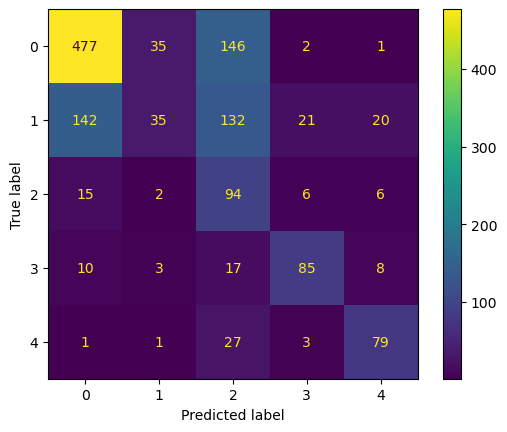

              precision    recall  f1-score   support

           0       0.74      0.72      0.73       661
           1       0.46      0.10      0.16       350
           2       0.23      0.76      0.35       123
           3       0.73      0.69      0.71       123
           4       0.69      0.71      0.70       111

    accuracy                           0.56      1368
   macro avg       0.57      0.60      0.53      1368
weighted avg       0.62      0.56      0.55      1368



In [48]:
fc_size=256
k_size=5
lr=0.0001

print(f'fc_size={fc_size}, k_size={k_size}, lr={lr}')
cnn = ConvNet(fc_size=fc_size, k_size=k_size).to('cuda')
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(cnn.parameters(), 
                             lr=lr,
                             amsgrad=True)
history = train_run(cnn,
                    optimizer,
                    criterion,
                    epochs_=epochs, 
                    train_dataloader_=train_dataloader,
                    val_dataloader_=val_dataloader,
                    val_every_n_minibatches=2000)

y_pred, y_true = predict(cnn, train_dataloader)
print('train performance')
performance_measures(y_true=y_true,
                    y_pred=y_pred,
                    print_=True,
                    confusion_mat=True,
                    cls_report=True)

y_pred, y_true = predict(cnn, val_dataloader)
print('val performance')
performance_measures(y_true=y_true,
                    y_pred=y_pred,
                    print_=True,
                    confusion_mat=True,
                    cls_report=True)


Adding image augmentation improves performance even further.

Various transformations are used: flips, rotation, scale, shift, blur, distortions, hue and saturation values:

In [49]:
augmentations = A.Compose([
    A.HorizontalFlip(p=0.5),
    A.VerticalFlip(p=0.5),
    A.ShiftScaleRotate(
        shift_limit=(-0.25, 0.25),
        scale_limit=(-0.5, 0.5),
        rotate_limit=(-180, 180),
        p=0.9,
    ),
    A.Blur(blur_limit=5),
    A.OpticalDistortion(),
    A.GridDistortion(),
    A.HueSaturationValue(),
])


In the cells below examples are shown what augmented images look like:

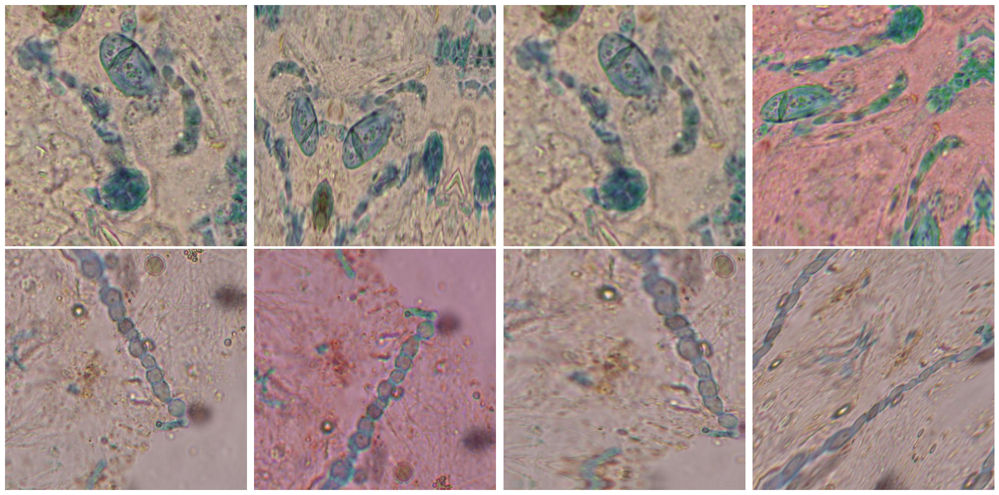

In [60]:
h5_good = get_img('../data/defungi/trainval/H5/H5_14a_3.jpg')
h2_good = get_img('../data/defungi/trainval/H2/H2_108a_1.jpg')

augmented_imgs5 = [
    get_img('../data/defungi/trainval/H5/H5_14a_3.jpg', 
            augmentations=augmentations)
    for _ in range(3)
]
augmented_imgs2 = [
    get_img('../data/defungi/trainval/H2/H2_108a_1.jpg', 
            augmentations=augmentations)
    for _ in range(3)
]

fig, axes = plt.subplots(nrows=2, ncols=4, figsize=(20, 10))
for ax in axes.ravel():
    ax.axis('off')

axes[0, 0].imshow(h5_good)
axes[1, 0].imshow(h2_good)
for i in range(3):
    axes[0, i + 1].imshow(augmented_imgs5[i])
    axes[1, i + 1].imshow(augmented_imgs2[i])
fig.tight_layout()
plt.show()


In [50]:
print('--TRAIN')
train_dataset = FungiDataset(fungi_root=f'{FUNGI_ROOT}train/',
                             balance=True,
                             augmentations=augmentations,  # add augmentations
                             transform=transform)

train_dataloader = DataLoader(
    train_dataset,
    batch_size=BATCH_SIZE,
    num_workers=NUM_WORKERS,
    shuffle=True,
    worker_init_fn=seed_worker,
    generator=torch.Generator().manual_seed(SEED),
)
print(f'TRAIN: Dataset size: {len(train_dataset)}')
print(f'TRAIN: Number of iterations per epoch: {len(train_dataloader)}')

--TRAIN
Class 0: 2862 samples
Class 1: 2862 samples
Class 2: 2862 samples
Class 3: 2862 samples
Class 4: 2862 samples
TRAIN: Dataset size: 14310
TRAIN: Number of iterations per epoch: 895


fc_size=256, k_size=5, lr=0.0001
train performance
Precision: 0.563000820070979
Recall: 0.5635918937805731


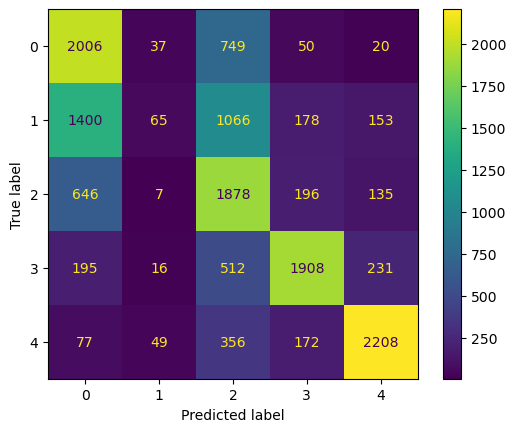

              precision    recall  f1-score   support

           0       0.46      0.70      0.56      2862
           1       0.37      0.02      0.04      2862
           2       0.41      0.66      0.51      2862
           3       0.76      0.67      0.71      2862
           4       0.80      0.77      0.79      2862

    accuracy                           0.56     14310
   macro avg       0.56      0.56      0.52     14310
weighted avg       0.56      0.56      0.52     14310

val performance
Precision: 0.5708085289547749
Recall: 0.6128222312673071


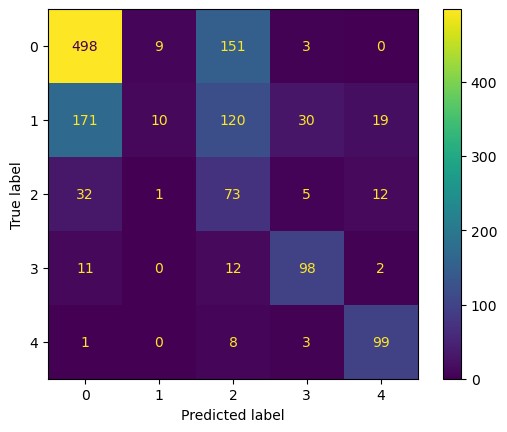

              precision    recall  f1-score   support

           0       0.70      0.75      0.72       661
           1       0.50      0.03      0.05       350
           2       0.20      0.59      0.30       123
           3       0.71      0.80      0.75       123
           4       0.75      0.89      0.81       111

    accuracy                           0.57      1368
   macro avg       0.57      0.61      0.53      1368
weighted avg       0.61      0.57      0.52      1368



In [51]:
fc_size=256
k_size=5
lr=0.0001

print(f'fc_size={fc_size}, k_size={k_size}, lr={lr}')
cnn = ConvNet(fc_size=fc_size, k_size=k_size).to('cuda')
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(cnn.parameters(), 
                             lr=lr,
                             amsgrad=True)
history = train_run(cnn,
                    optimizer,
                    criterion,
                    epochs_=epochs, 
                    train_dataloader_=train_dataloader,
                    val_dataloader_=val_dataloader,
                    val_every_n_minibatches=2000)

y_pred, y_true = predict(cnn, train_dataloader)
print('train performance')
performance_measures(y_true=y_true,
                    y_pred=y_pred,
                    print_=True,
                    confusion_mat=True,
                    cls_report=True)

y_pred, y_true = predict(cnn, val_dataloader)
print('val performance')
performance_measures(y_true=y_true,
                    y_pred=y_pred,
                    print_=True,
                    confusion_mat=True,
                    cls_report=True)


### d) Performance metrics for training (5 marks)

Final CNN model training on trainval subset:

In [52]:
print('--TRAIN')
trainval_dataset = FungiDataset(fungi_root=f'{FUNGI_ROOT}trainval/',
                             balance=True,
                             augmentations=augmentations,
                             transform=transform)

trainval_dataloader = DataLoader(
    trainval_dataset,
    batch_size=BATCH_SIZE,
    num_workers=NUM_WORKERS,
    shuffle=True,
    worker_init_fn=seed_worker,
    generator=torch.Generator().manual_seed(SEED),
)
print(f'TRAIN: Dataset size: {len(trainval_dataset)}')
print(f'TRAIN: Number of iterations per epoch: {len(trainval_dataloader)}')

--TRAIN
Class 0: 3523 samples
Class 1: 3523 samples
Class 2: 3523 samples
Class 3: 3523 samples
Class 4: 3523 samples
TRAIN: Dataset size: 17615
TRAIN: Number of iterations per epoch: 1101


fc_size=256, k_size=5, lr=0.0001
train performance
Precision: 0.6777074893373809
Recall: 0.6800454158387739


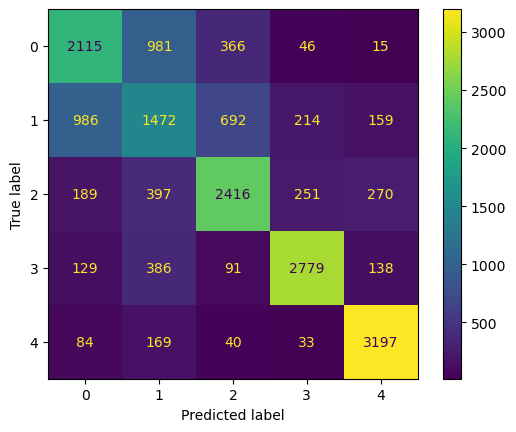

              precision    recall  f1-score   support

           0       0.60      0.60      0.60      3523
           1       0.43      0.42      0.42      3523
           2       0.67      0.69      0.68      3523
           3       0.84      0.79      0.81      3523
           4       0.85      0.91      0.88      3523

    accuracy                           0.68     17615
   macro avg       0.68      0.68      0.68     17615
weighted avg       0.68      0.68      0.68     17615



In [53]:
fc_size=256
k_size=5
lr=0.0001
epochs=10

print(f'fc_size={fc_size}, k_size={k_size}, lr={lr}')
cnn_final_model = ConvNet(fc_size=fc_size, k_size=k_size).to('cuda')
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(cnn_final_model.parameters(), 
                             lr=lr,
                             amsgrad=True)
history = train_run(cnn_final_model,
                    optimizer,
                    criterion,
                    epochs_=epochs, 
                    train_dataloader_=trainval_dataloader,
                    val_dataloader_=None,
                    val_every_n_minibatches=2000)

y_pred, y_true = predict(cnn_final_model, trainval_dataloader)
print('train performance')
performance_measures(y_true=y_true,
                    y_pred=y_pred,
                    print_=True,
                    confusion_mat=True,
                    cls_report=True)


## 6. Comparison of metrics performance for testing 


### a) Examining over-fitting (4 marks)

fc_size=256, k_size=5, lr=0.0001
EPOCH 0: TRAIN_LOSS=1.49973 VAL_LOSS=1.35338
EPOCH 0: TRAIN_LOSS=1.41868 VAL_LOSS=1.38454
EPOCH 0: TRAIN_LOSS=1.38468 VAL_LOSS=1.20345
EPOCH 0: TRAIN_LOSS=1.36405 VAL_LOSS=1.10587
EPOCH 1: TRAIN_LOSS=1.21785 VAL_LOSS=1.16675
EPOCH 1: TRAIN_LOSS=1.19386 VAL_LOSS=1.00648
EPOCH 1: TRAIN_LOSS=1.17831 VAL_LOSS=1.01183
EPOCH 1: TRAIN_LOSS=1.16615 VAL_LOSS=0.97370
EPOCH 2: TRAIN_LOSS=1.12182 VAL_LOSS=0.97970
EPOCH 2: TRAIN_LOSS=1.11910 VAL_LOSS=1.02079
EPOCH 2: TRAIN_LOSS=1.10834 VAL_LOSS=0.95894
EPOCH 2: TRAIN_LOSS=1.10099 VAL_LOSS=1.28872
EPOCH 3: TRAIN_LOSS=1.05798 VAL_LOSS=1.01098
EPOCH 3: TRAIN_LOSS=1.04699 VAL_LOSS=0.99692
EPOCH 3: TRAIN_LOSS=1.04599 VAL_LOSS=0.90636
EPOCH 3: TRAIN_LOSS=1.03672 VAL_LOSS=0.91547
EPOCH 4: TRAIN_LOSS=0.99734 VAL_LOSS=0.91351
EPOCH 4: TRAIN_LOSS=0.99609 VAL_LOSS=0.93088
EPOCH 4: TRAIN_LOSS=0.98322 VAL_LOSS=0.94244
EPOCH 4: TRAIN_LOSS=0.98837 VAL_LOSS=0.98601
EPOCH 5: TRAIN_LOSS=0.98033 VAL_LOSS=1.04047
EPOCH 5: TRAIN_LOSS=0.

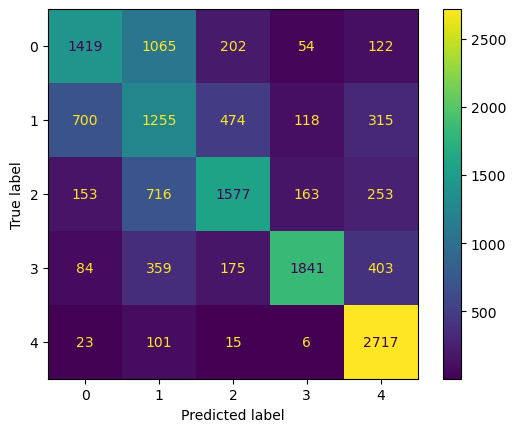

              precision    recall  f1-score   support

           0       0.60      0.50      0.54      2862
           1       0.36      0.44      0.39      2862
           2       0.65      0.55      0.59      2862
           3       0.84      0.64      0.73      2862
           4       0.71      0.95      0.81      2862

    accuracy                           0.62     14310
   macro avg       0.63      0.62      0.62     14310
weighted avg       0.63      0.62      0.62     14310

train performance
Precision: 0.5599478886450024
Recall: 0.6323899751143026


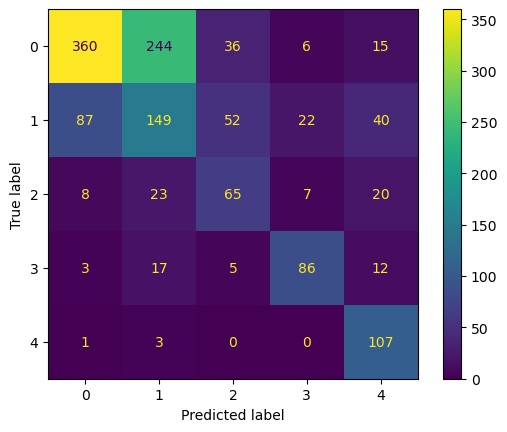

              precision    recall  f1-score   support

           0       0.78      0.54      0.64       661
           1       0.34      0.43      0.38       350
           2       0.41      0.53      0.46       123
           3       0.71      0.70      0.70       123
           4       0.55      0.96      0.70       111

    accuracy                           0.56      1368
   macro avg       0.56      0.63      0.58      1368
weighted avg       0.61      0.56      0.57      1368



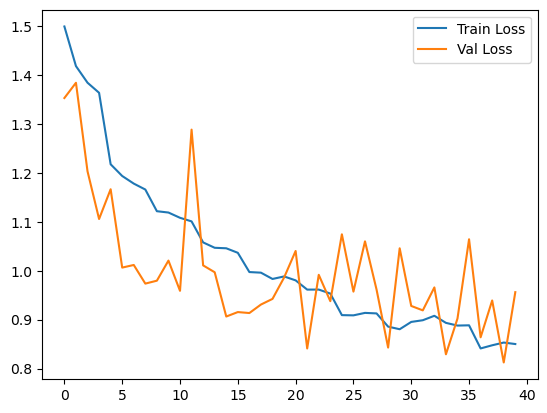

In [54]:
fc_size=256
k_size=5
lr=0.0001
epochs=10

print(f'fc_size={fc_size}, k_size={k_size}, lr={lr}')
cnn = ConvNet(fc_size=fc_size, k_size=k_size).to('cuda')
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(cnn.parameters(), 
                             lr=lr,
                             amsgrad=True)
history = train_run(cnn,
                    optimizer,
                    criterion,
                    epochs_=epochs, 
                    train_dataloader_=train_dataloader,
                    val_dataloader_=val_dataloader,
                    val_every_n_minibatches=200)

y_pred, y_true = predict(cnn, train_dataloader)
print('train performance')
performance_measures(y_true=y_true,
                    y_pred=y_pred,
                    print_=True,
                    confusion_mat=True,
                    cls_report=True)

y_pred, y_true = predict(cnn, val_dataloader)
print('train performance')
performance_measures(y_true=y_true,
                    y_pred=y_pred,
                    print_=True,
                    confusion_mat=True,
                    cls_report=True)

plot_train_val_loss(history)


Comparison of performance metrics on train and validation subsets shows that the CNN model did not overfit:
* Train Precision: 0.631
* Train Recall: 0.615
* Val Precision: 0.559
* Val Recall: 0.632

Train and validation loss plot above also does not show any significant signs of overfitting.


SVM model also trained without overfittin, as can be seen from the metrics:
* Train Precision: 0.386
* Train Recall: 0.322
* Val Precision: 0.414
* Val Recall: 0.332

### b) Comparison with appropriate metrics for testing (4 marks)

test performance
Precision: 0.44601284838121924
Recall: 0.30184902848841333


/home/sibeard/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


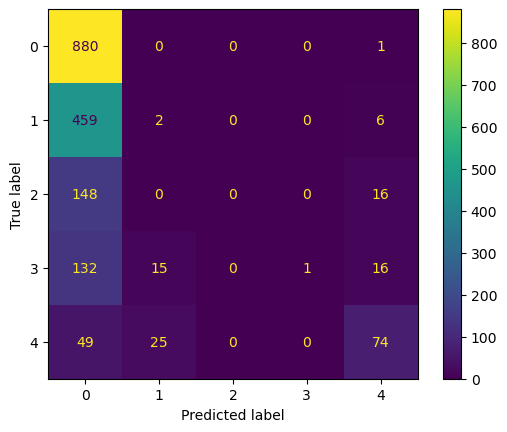

              precision    recall  f1-score   support

           0       0.53      1.00      0.69       881
           1       0.05      0.00      0.01       467
           2       0.00      0.00      0.00       164
           3       1.00      0.01      0.01       164
           4       0.65      0.50      0.57       148

    accuracy                           0.52      1824
   macro avg       0.45      0.30      0.26      1824
weighted avg       0.41      0.52      0.38      1824



/home/sibeard/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/sibeard/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/sibeard/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [57]:
y_pred, y_true = predict(svm, test_dataloader)
print('test performance')
performance_measures(y_true=y_true,
                     y_pred=y_pred,
                     print_=True,
                     confusion_mat=True,
                     cls_report=True)

test performance
Precision: 0.6193141818826652
Recall: 0.6805130995756639


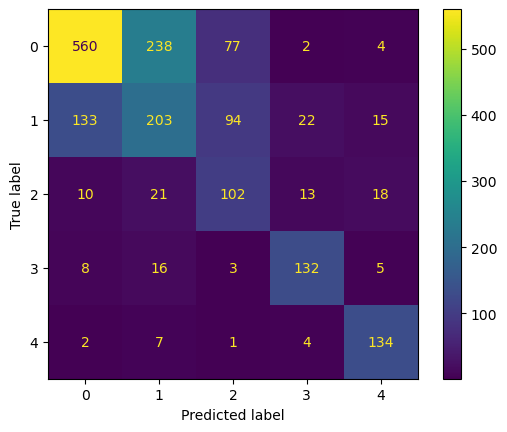

              precision    recall  f1-score   support

           0       0.79      0.64      0.70       881
           1       0.42      0.43      0.43       467
           2       0.37      0.62      0.46       164
           3       0.76      0.80      0.78       164
           4       0.76      0.91      0.83       148

    accuracy                           0.62      1824
   macro avg       0.62      0.68      0.64      1824
weighted avg       0.65      0.62      0.63      1824



In [58]:
y_pred, y_true = predict(cnn_final_model, test_dataloader)
print('test performance')
performance_measures(y_true=y_true,
                     y_pred=y_pred,
                     print_=True,
                     confusion_mat=True,
                     cls_report=True)

### c) Model selection (4 marks)

Based on the performance metrics, calculated above, CNN model clearly outperforms SVM:
* SVM Test Precision: 0.446
* SVM Test Recall: 0.301
* CNN Test Precision: 0.619
* CNN Test Recall: 0.680

## 7. Final recommendation of best model

### a) Discuss the results from a technical perspective, for example, overfitting discussion, complexity and efficiency (4 marks)



Overall, Convolutional Neural Network approach showed better performance compared to Support Vector Machine model, which is expectable, as CNN is a much more complex model. Neither of the models showed signs of overfitting, based on comparison of metrics on training and validation subsets and additionally based on train and validation loss plot for neural network model. The downside of CNN model is its computation complexity - it requires significantly more resources to train and run. If hardware resources are strictly limited, SVM would be a better choice, otherwise - CNN model is much more capable.

### b) Discuss the results from a business perspective, for example, results interpretation, relevance and balance with technical perspective (4 marks)



From a business perspective, Convolutional Neural Network, as a more capable model, would provide more reliable class predictions. At the same time, due to its complexity it would be hard to interpret such model's predictions to come up with explanations for the decision making process. Support Vector Machine classifier, although less powerful, is a more interpretable and lightweight model, which would allow for fast inference. It's predictions can be justified with the support vectors learned from the data.

## 8. Conclusion

### a) What has been successfully accomplished and what has not been successful? (4 marks)


Overall, the objectives and the aim of the project have been accomplished. The dataset has been explored and its main features examined. Model training, hyper-parameter tuning with validation has been conducted, performance measures of the two models have been compared and analysed. Issues of the dataset have been addressed in the model training process. The analysis has been presented in a technical report.

### b) Reflecting back on the analysis, what could you have done differently if you were to do the project again? (4 marks)


Data balancing and image augmentation techniques could have been also applied in the SVM training procedures, for a fair comparison with CNN model. More hyper-parameters could have been explored, e.g. number of convolutional layers in CNN. Most importantly, kernel tricks could have been used in SVM model - different non-linear kernels exploration (e.g. RBF kernel, polynomial kernel, etc.) could have led to better performance of the SVM model.

### c) Provide a wish list of future work that you would like to do (4 marks)


Different hyper-parameter search techniques could be applied, for example, randomized grid search or genetic algorithms. To deal with images of low quality or images without objects, some basic algorithms can be applied such as edge detectors to filter out poor samples. Addressing the problem of features of greatly varying scale, dilated (or atrous in other sources) convolutions can be applied: this type of convolutions is specifically dedicated to deal with features which have different scale. These dilated convolutions can be embedded in a trained model by applying existing kernels on different scales, by adding gaps between the kernel weights to increase perceptive field of the kernel [[Multi-Scale Context Aggregation by Dilated Convolutions](https://arxiv.org/abs/1511.07122)].